Homework 1 — (15 points)
======
### What to hand in
1. A Jupyter notebook containing all code and output (figures and audio). I should be able to evaluate the file to reproduce all output. 
1. Any other data that we tell you to save to a file (e.g. audio files).

### How to hand it in
1. Compress all of the files specified into a .zip file. 
1. Name the file in the following manner, firstname_lastname_hw1.zip. For example, Bryan_Pardo_hw1.zip. 
1. Submit this .zip file via Canvas

## Run this code block 1st, to import likely needed packages

In [32]:
# This line imports most packages you'll need. You may need to import others (eg random and cmath)
import IPython, numpy as np, scipy as sp, matplotlib.pyplot as plt, matplotlib, sklearn, librosa, cmath,math
from IPython.display import Audio

# This line makes sure your plots happen IN the webpage you're building, instead of in separate windows.
%matplotlib inline

## Questions

#### 1. (one point) Go out on the web and read about the early history of audio recording. Thomas Edison, Alexandar Graham Bell,  Édouard-Léon Scott de Martinville and Valdemar Poulsen are all big names in the history of audio recording. Give a brief overview (no more than two sentences) for each of these people on what that person contributed to audio recording.

Edison, Thomas- He  invented the phonograph in the late 1870s. It was foil wrapped around a cylinder.

Graham Bell, Alexandar- Invented  the telephone which was a breakthrough communication device used to allow people to remotley  communicate via voice with each other

Léon Scott, Edouard de Martinville-phonautograph inventor, this could  record  sounds as like pictures, but  it could sadly not play back audio.

Poulsen, Valdemar- telegraphone inventor, which records sounds with a magnetic/thin steel wire. 

#### 2. (one point)  The sample rate of telephone audio (8 kHz) and CD quality audio (44.1 kHz) are very different. Explain what effect this difference in sample rate has on the ability of a recorder to reproduce sound and why the sample rate of CD audio is what it is. 

The sample rate of telephone  is  much lower than that of CD quality because of the  fact that the networks want to limit the bandwith used. When reconstrucintg and playing lower bit audio the audio being played is done at a less frequent Sample Rate. Similar to  video  in that frequent pictures are recorded and played , audio is recorded not continously but at a sample rate.  8 khz is 8000 hertz, or 8000 samples per second. 44.1 on the other hand is 44,100 samples per second. Higher sample rates, require less data between the samples data to be "guessed" by the player.

It has been said that the if you want to safetly record a sound to do so at a tad bit more than twice the  frequency. 20kHz is the most a 20 year old average person can hear at sea level, so 44.1kz is a bit more than twice that. 

#### Sample rate isn't the only difference between CD and telephone audio. Express in dB the difference in dynamic range between 8 bit audio (telephone quality) and 16 bit audio (CD quality).  How many bits would one need to exceed the dynamic range of human hearing? Show you work.

1.) the difference is 48.1647 hertz
2.) 21 DB, see source below to get max DB input of 127db
http://www.noisehelp.com/noise-dose.html says that at 127 db a human can hear without longterm damage for 1 second.

In [200]:
def finddynamicrange(bits):
     return 20*np.log10(2**bits)

print ((finddynamicrange(16))-(finddynamicrange(8)))

def findbits(db):
    return db/6

print findbits(127)



48.1647993062
21


#### 3. (one point) Make a function to generate sinewaves. Test the function for a simple case (e.g. a sinewave of frequency 10 Hz and length 1 sec, sampled at a rate of 100 Hz). Write a function to plot an audio signal and use it to display the generated sinewave (you can write your own plotting function or use the "plot_audio" function provided in the previous homework). Label the figure's axes appropriately.


In [206]:
def make_sinewave(f, t, sr):
    """    
    Parameters
    ----------
    f:  float
        Frequency of sine wave
    t:  float
        Duration in seconds
    sr: int
        Sample rate
    
    Returns
    -------
    np.ndarray 
        Array of floats containing the signal
    """

    return np.sin([2 * 3.1415162342 * f * q / sr for q in range(int(sr * t))])
    
    
def plot_audio(x, sr, figsize=(16,4)):
    """
    A simple audio plotting function
    
    Parameters
    ----------
    x: np.ndarray
        Audio signal to plot
    sr: int
        Sample rate
    figsize: tuple
        A duple representing the figure size (xdim,ydim)
    """
    length = float(x.shape[0]) / sr
    t = np.linspace(0,length,x.shape[0])
    plt.figure(figsize=figsize)
    plt.plot(t, x)
    plt.xlabel('Time in seconds')
    plt.ylabel('Amplitude')
    plt.show()
    

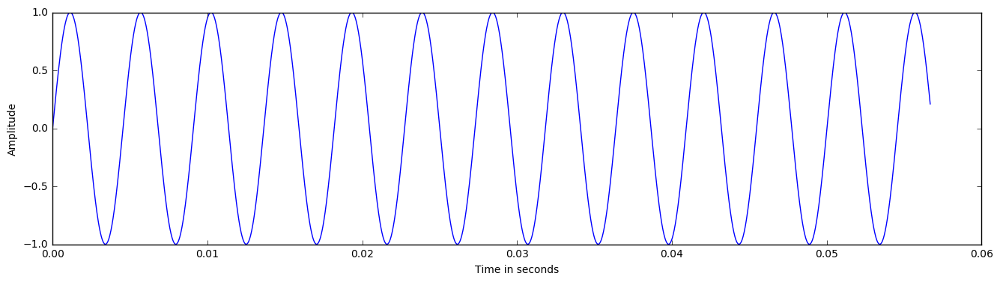

In [207]:
sound = make_sinewave(220., 3., 44100.)
plot_audio(sound[:2500], 44100.)
Audio(sound, rate=44100)


#### 4. (one point) What 3 pitch classes are in a C major triad? Make a C major triad out of sine waves that is in the same octave as A440 (i.e. starting on the C below A440). Display the waveform and play it.

C# E#and G# according to https://www.basicmusictheory.com/c-sharp-major-triad-chord 

They have pitch rates of...
C: 

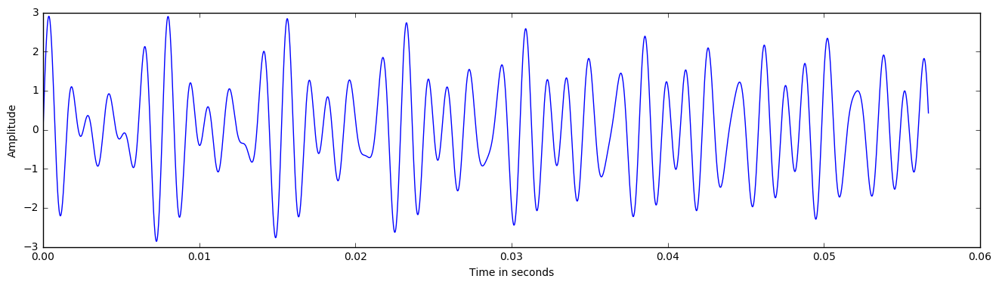

In [203]:
c=523.25
e=659.26
G=783.99

cwave=make_sinewave(c,3.,44100.)
ewave=make_sinewave(e,3.,44100.)
gwave=make_sinewave(G,3.,44100.)

thebigwave=cwave+ewave+gwave
plot_audio(thebigwave[:2500], 44100)
Audio(thebigwave, rate=44100)

#### 5. (one point) Implement a simple function to express the Root Mean Squared Amplitude of a signal encoded as an array, in dB, with respect to a reference value (review the lecture on amplitude, slides no. 5-8).

In [208]:
def rms_db(signal, reference):
    '''
    Parameters
    ----------
    signal:  np.ndarray 
        Array of floats containing the signal
    reference:  float
        A reference amplitude to compare to 

    Returns
    -------
    float
        a value in dB, given the reference value
    '''
    rootmeansquared = np.sqrt(np.mean(np.square(signal)))
    return (20. * np.log10(0.00000001 + rootmeansquared/reference))

#### 6. (one point) Make a signal.  Vary its volume and find out for yourself how many dB different sounds have to be, before you can tell the volume is different?  Play identical pairs, where the only difference between them is the amplitude. Start with 0 db difference, and grow the difference until you can reliably tell them apart.   Oh...and do this in a quiet room with headphones on. This won't work at all on your laptop speakers or in a loud room.

Using wired headphones, I can hear a difference at about .8db in a quiet room. 

In [211]:
#write your code to make repeated pairs of audio that vary by differing dB amounts here.
total = np.zeros(0)
print 'every 4 seconds is a db difference of .1'
for i in range(1, 20):
    mult = math.pow(10, -i/10/20.)
    old = make_sinewave(440, 2, 44100)
    new = make_sinewave(440, 1, 44100) * mult
    quiet = make_sinewave(0, 1, 44100)
    total = np.concatenate((total, old, new, quiet))
Audio(total, rate=44100)

every 4 seconds is a db difference of .1


#### 7. (one point) Implement a Fourier transform function and an inverse Fourier transform function using the formulae from the course lecture notes.

In [134]:
def fourier_transform(x):
    """ 
    Performs a Fourier transform
    
    Parameters
    ----------
    x: np.ndarray 
        Array of real or complex values containing the signal
    
    Returns
    -------
    np.ndarray 
        Array of complex vaules containing the signal
    """
    num = 0
    xsize = x.size
    key = list()
    
    for a in range(xsize):
        num = 0
        for b in range(xsize):
            exp = (-2j)*np.pi*a*b/xsize
            num += x[b]*np.exp(exp)
        key.append(num)
            
    key = np.array(key)
    return key

In [135]:

 
def inverse_fourier_transform(X):
    """ 
    Performs an inverse Fourier transform
    
    Parameters
    ----------
    x: np.ndarray 
        Array of  complex values containing the signal
    
    Return
    ------
    np.ndarray 
        Array of complex vaules containing the signal
    """
    num = 0
    xsize = X.size
    key = list()
    
    for c in range(xsize):
        num = 0
        for d in range (xsize):
            theexp = 2j*np.pi*d*c/xsize
            num += X[d] * np.exp(theexp)
        key.append(num/xsize)
    
    key = np.array(key)
    return key


#### 8. (one point) Write code to test that these functions work properly. Be sure to explain why you think your test is a good one.

You said you expected to see a test that would test two things.

The first two graphs are the graph of a 523.25 hz sin  way (a c note!) and then tkes the fourier transformation and the inverse of it! If these fucntions were correct then  the graphs would appear the same! (THEY DO!)

The third graph is the fourier transformation of the C Note. It looks correct!

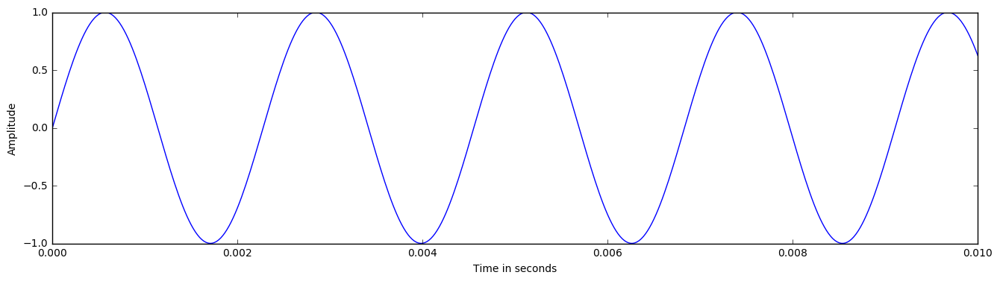

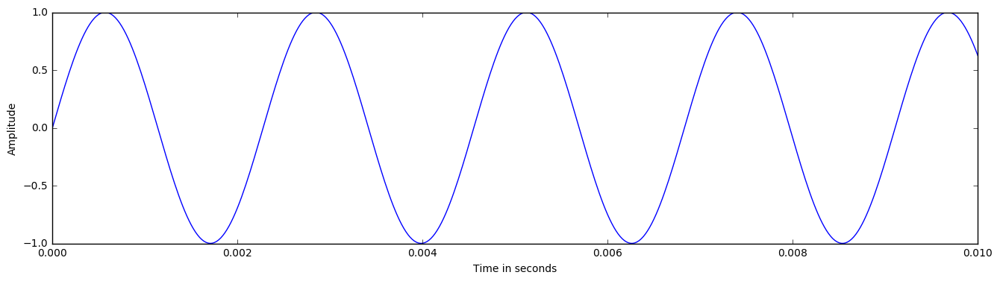

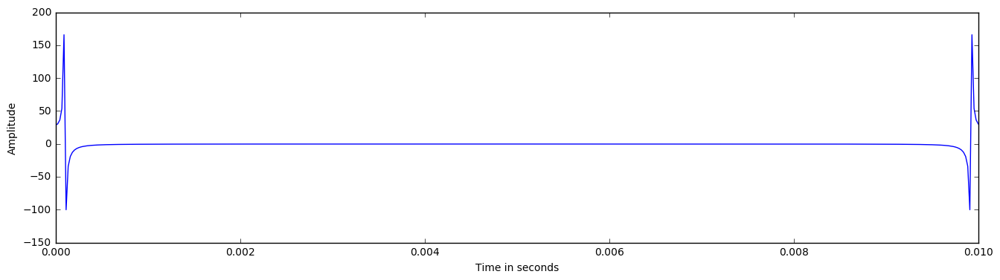

In [213]:
# Write your code to check here. 
#  Be sure to explain in your comments how this test confirms the correctness.
# NOTE: 2 things *I* would test are (1) if I take the Fourier transform of a signal, 
# and then take its output as the input to the inverse Fourier transform, does the 
# result look like the original signal?  and (2) If I look at the result of the 
# Fourier transform, do I see a pattern of energy that I would expect to see, given
# what the input signal contains?
#tests to see
Csinewave=make_sinewave(440.25,.01,44100.)
t1=fourier_transform(Csinewave)
t2=inverse_fourier_transform(t1)
plot_audio(Csinewave, 44100)
plot_audio(t2,44100)
#Plots the audio of the fourier transformation of the C note
plot_audio(t1,44100)





From this point on, you will use the fft and ifft functions from scipy, as they are much faster than the code you just wrote. See the following link for documentation on them. 
http://docs.scipy.org/doc/scipy/reference/tutorial/fftpack.html


Hint: https://docs.python.org/2/library/timeit.html and https://docs.python.org/2/library/time.html  are useful for the following problem.
            

#### 9. (one point) What is the computational complexity of the Fourier Transform  code you built? What is the computational complexity of the Fast Fourier Transform (FFT)? Illustrate the difference in running time by measuring how long it takes your fourier_transform code on signals of different length and plot the time to completion (vertical axis) as a function of the number of samples (horizontal axis). Compare that on the same graph to how long it took on the same number of samples with the python FFT. Do these time numbers back up the computational complexity?

Was confused on how to time stuff but Google sent me to this library (https://docs.python.org/2/library/time.html) used for reference 

from looking at it I found there to be an O(N^2) for the old function and O(nlog(n) for the new function. The numbers on the graph are a bit inconsistent but with more trials it would show O(N^2). 

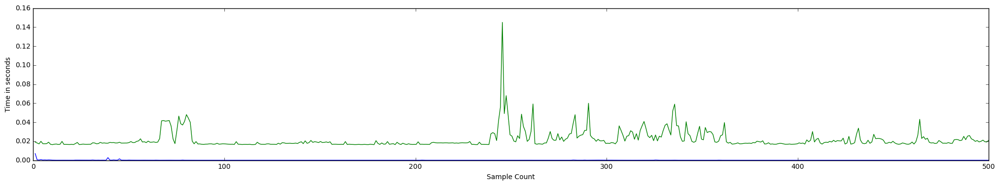

In [210]:
import time
start = 1
end = 500
delta = 1
Csinewave=make_sinewave(523.25,.01,8000.)
timedatanew = []
for a in xrange(start, end, delta):
    thetime = time.time()
    sp.fft(Csinewave[:a])
    timedatanew.append(time.time() - thetime)
timedataold = []
for a in xrange(start, end, delta):
    thetime = time.time()
    fourier_transform(Csinewave)
    timedataold.append(time.time() - thetime)



tdata = np.linspace(start, end, (end - start) / delta)
plt.figure(figsize=(25,4))
plt.plot(tdata, timedatanew)
plt.plot(tdata, timedataold)
plt.xlabel('Sample Count')
plt.ylabel('Time in seconds')


plt.show()

#### 10. (one point) The choice of windowing function for your FFT is an important one. In this problem, we are going to investigate the effect of windowing on the spectra of sine waves. Write a function to compute the log-magnitude spectrum of a signal. Your function must receive the number of frequency samples as an input (there is an optional parameter in scipy's fft that lets you specify how many points the FFT has). 

#### Make an audio signal composed of 2 sine waves at 100 and 250 Hz. The sample rate should be 1000 Hz. Now compute the spectrum of the signal using a rectangular window of length 64 samples. In this part we set the number of FFT points to the same value as the window length. Then compute the spectrum using a a Hann window (from scipy.signal). Plot both spectra on the same axis. Compare the two plots. Be sure to label the frequency dimension correctly (horizontal = frequency in Hz) with the correct units. Be sure to label your two lines so we can tell which is which.

#### Which approach do you think gives a more accurate visualization of the signal contents, windowing the signal with a rectangular window or with a Hann window? Which one looks more accurate? What is the underlying reason? 

Looking at both graphs, it is obvious to anyone that pays attention in class or unnderstand graphs that Hann is much much better! It is not even a fair comparision. The hann graph makes it much more obvious where the signals are. 

In [273]:
def audio_spectrum(sig, win_len, win_type, Nfft):
    """
    Computes the spectrum of the first win_len samples of an audio signal
    
    Parameters
    ----------
    sig: np.ndarray
        Audio signal 
    win_len: int
        Length of the portion of the signal for which we calclate the spectrum(in samples).
        This should range between 1 and the length of sig.
    win_type: string
        Determines the window type including 'rectangular' and 'hann'
    Nfft: int
        Number of fft points (if Nfft is greater than win_len the fft function would zero pad the 
        windowed signal, if Nfft is smaller than win_len the "audio_spectrum funtion must generate 
        an error message)     
    """
    if win_type == "rectangular":
        window = np.concatenate((np.ones((win_len,)), np.zeros((sig.shape[0] - win_len,))))
    
    if win_type == "hann":

        window = np.concatenate((sp.signal.hann(win_len), np.zeros((sig.shape[0] - win_len,))))
    
    newsig = sp.fftpack.fft(np.multiply(sig, window), n=Nfft)
    
    # Plot
    plt.plot(np.linspace(0.0, 500, Nfft/2)  , 20 * np.log10(np.abs(newsig[:Nfft/2])), label=win_type)


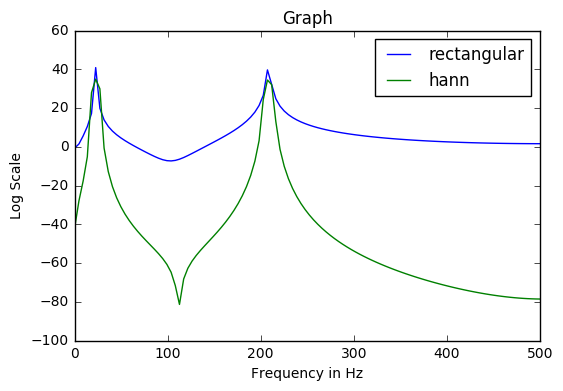

In [274]:
signal = make_sinewave(155, 2, 750) + make_sinewave(17, 2.0, 750)
graph, scale = plt.subplots()
audio_spectrum(signal, 224, "rectangular", 224)
audio_spectrum(signal, 224, "hann", 224)
plt.legend()
scale.set_xlabel('Frequency in Hz')
scale.set_title('Graph')
scale.set_ylabel('Log Scale')

plt.show()

#### 11. (one point)  Now, do everything exactly like you did in question 10....except increase the number of FFT points (Nfft) to 256 and then to 512 (the window length win_len stays the same). When you calculate a FFT with more points than are in the signal, zeros are added to the input signal and interpolation is performed on the output signal. In general, zero-padding in the time domain is equivalent to creating new analysis bins in between original bins in the frequency domain. This often gives us a more accurate view of the frequency content in the signal. What are some of differences you notice in these plot compared to the previous one and what do you think is the underlying reason? What stays the same and what changes between the three plots?

You can read more about the effect of zero-padding on the frequency-domain representation in the follwing pages:

http://www.dsprelated.com/freebooks/sasp/Zero_Padding_Time_Domain.html

http://dspguru.com/dsp/howtos/how-to-interpolate-in-time-domain-by-zero-padding-in-frequency-domain



The largest difference in this plot compared to the plot from  the previous one has more zig zag! That makes a bigger differnetial of the graphs and the logs  of the frequencies in Hertz. 

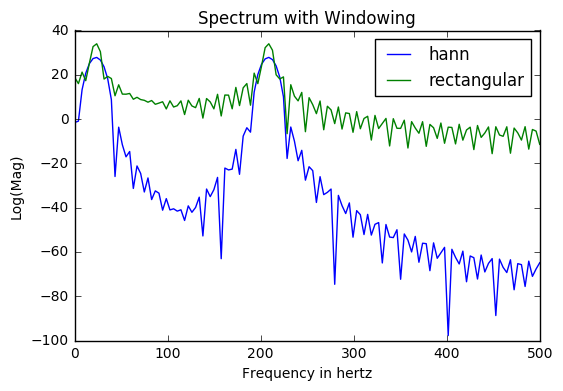

In [276]:

fig, ax = plt.subplots()
audio_spectrum(signal, 100, "hann", 256)
audio_spectrum(signal, 100, "rectangular", 256)
plt.legend()
ax.set_title('Spectrum with Windowing')
ax.set_xlabel('Frequency in hertz')
ax.set_ylabel('Log(Mag)')

plt.show()



#### 12. (one point) What is the pitch (in Hz) of the lowest note played by a well-tuned piano using equal temperment tuned at A440? What is the pitch (in Hz) of the highest note? Now, given these numbers, assume you're recording at 44100 Hz (CD quality audio). Give a window length (in samples) so that the spacing between frequency bins (and therefore the frequency of the lowest component you can represent) is low enough to capture the lowest note on the piano. 

The lowest note on a piano is  A0, of 27.5Hz.

The highest note on said Piano is  C8, of 4186Hz 

A total of 1603 samples is needed.  This is found by simple divison (44100 (the cd quality rate)/ 27.5 (the LOWEST TUNE!)


#### 13. (one point) The case of the missing fundamental is where a sound seems to have a pitch at frequency F0, but has no energy at this frequency.  Instead all the frequency is at integer multiples of F0. Build an audio example that illustrates the case of the missing fundamental: First play a harmonic sound with 10 harmonics (including F0).  Let's make it the C one octave below Middle C on the piano: 131 Hz. Then, successively remove each harmonic, starting from the lowest, to the highest (F0, then F1....etc). How many harmonics had to disappear before it sounded like the pitch changed?

after 3 harmonoincs (Fo,f1 and f2) i noticed a difference using headphones in a relaltiy quiet room (only noise was rain on roof anad fridge making some weird buzzing )

In [162]:
f0 = make_sinewave(131., 1., 44100)
f1 = make_sinewave(262., 1., 44100)
f2 = make_sinewave(393., 1., 44100)
f3 = make_sinewave(524., 1., 44100)
f4 = make_sinewave(655., 1., 44100)
f5 = make_sinewave(786., 1., 44100)
f6 = make_sinewave(917., 1., 44100)
f7 = make_sinewave(1048., 1., 44100)
f8 = make_sinewave(1179., 1., 44100)
f9 = make_sinewave(1310., 1., 44100)

everything = f0 + f1 + f2 + f3 + f4 + f5 + f6 + f7 + f8 + f9
f1on = f1 + f2 + f3 + f4 + f5 + f6 + f7 + f8 + f9
f2on = f2 + f3 + f4 + f5 + f6 + f7 + f8 + f9
f3on = f3 + f4 + f5 + f6 + f7 + f8 + f9
f4on = f4 + f5 + f6 + f7 + f8 + f9
f5on = f5 + f6 + f7 + f8 + f9
f6on = f6 + f7 + f8 + f9
f7on = f7 + f8 + f9
f8on = f8 + f9

#go through by commenting. 
Audio( everything, rate=44100)
#Audio( f1on, rate=44100)
#Audio( f2on, rate=44100)
#Audio( f3on, rate=44100)
#Audio( f4on, rate=44100)
#Audio( f5on, rate=44100)
#Audio( f6on, rate=44100)
#Audio( f7on, rate=44100)
#Audio( f8on, rate=44100)
#Audio( f9, rate=44100)







#### 14. (one point) Masking is where one sine wave makes a softer sine wave of nearby frequency inaudible. In class, you learned that our frequency sensitivity is related to the log of the frequency. This means that a lower tone will mask a broader frequency range above it than it does below it. We're going to explore that in this problem.  Make a sine wave at 1000 Hz.  Now, make a 2nd sine wave that is 30 dB softer and 50 Hz lower. Play them simultaneusly. Can you hear both? Now repeatedly lower the frequency of the softer sine wave by 50 Hz. At what frequency does it become really obvious that there are two sine waves?  Now try it the other direction.  Make the softer tone at 1050 Hz and vary it upward by 50 Hz each time. Now at what frequency does the softer tone become obvious? By the way....do this experiment with decent headphones in a quiet room. Don't use your laptop speakers in a noisy place.

Going down and up in frequencies we find... the following

It is audible  difference at 800 for the first trial and 1450 for the second. This was done in a quiet room with headphones. However, I am very congested from a cold so I do not know if that is making a difference in hearing. 

In [163]:
# your code to illustrate masking goes here
sinewave = 31.7 * make_sinewave(1000., 1., 44100)

#b = make_sinewave(950., 1., 44100)
#b = make_sinewave(900., 1., 44100)
#b = make_sinewave(850., 1., 44100) 
#b = make_sinewave(800., 1., 44100)
#b = make_sinewave(750., 1., 44100)
#b = make_sinewave(700., 1., 44100)
#becomes obvious at 800

b = make_sinewave(1050., 1., 44100)
#b = make_sinewave(1100., 1., 44100)
#b = make_sinewave(1150., 1., 44100)
#b = make_sinewave(1200., 1., 44100)
#b = make_sinewave(1250., 1., 44100)
#b = make_sinewave(1300., 1., 44100) 
#b = make_sinewave(1350., 11., 44100)
#b = make_sinewave(1400., 1., 44100)
#b = make_sinewave(1450., 1., 44100)
#b = make_sinewave(1500., 1., 44100)
#b = make_sinewave(1550., 1., 44100)
#b = make_sinewave(1600., 1., 44100)

#becomes obvious at 1450

Audio(b+sinewave, rate=44100)




#### 15. (one point) Explain, in your own words, what the cochlea does and how it does it.

Source: https://en.wikipedia.org/wiki/Cochlea 

The Cochlea  is a part of the inner ear that  translates sounds into signals sent to the brain. This cochlea contains a part that resonates with sounds using hairs that determine the frequencies. The issue is that at many times, there is possibility of damaging this hair and thus as said in class it is important to using hearing protection.  The Cochlea works with different body parts as a system to determine 
